In [3]:
from IPython.display import SVG

import numpy as np
from scipy import sparse
import pandas as pd

from sknetwork.data import from_edge_list, from_adjacency_list, from_graphml, from_csv, load_netset, load_konect
from sknetwork.data import erdos_renyi, block_model, linear_graph, cyclic_graph, linear_digraph, cyclic_digraph, grid, albert_barabasi, watts_strogatz
from sknetwork.data import karate_club, painters

from sknetwork.topology import get_connected_components, get_largest_connected_component, CoreDecomposition

from sknetwork.visualization import svg_graph, svg_digraph, svg_bigraph
from sknetwork.utils import directed2undirected
import json as js
import matplotlib.pyplot as plt
import networkx as nx

In [4]:
with open("wikivital_mathematics.json", "r") as read_file:
    data = js.load(read_file)

In [49]:
data.keys()

dict_keys(['edges', 'weights', 'node_ids', 'time_periods', '0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49', '50', '51', '52', '53', '54', '55', '56', '57', '58', '59', '60', '61', '62', '63', '64', '65', '66', '67', '68', '69', '70', '71', '72', '73', '74', '75', '76', '77', '78', '79', '80', '81', '82', '83', '84', '85', '86', '87', '88', '89', '90', '91', '92', '93', '94', '95', '96', '97', '98', '99', '100', '101', '102', '103', '104', '105', '106', '107', '108', '109', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '120', '121', '122', '123', '124', '125', '126', '127', '128', '129', '130', '131', '132', '133', '134', '135', '136', '137', '138', '139', '140', '141', '142', '143', '144', '145', '146', '147', '148', '149', '

In [5]:
edges = np.array(data['edges'])
weights = np.array(data['weights'])

weighted_edges = [edge + [weigth] for edge, weigth in zip(data['edges'], data['weights'])]
weighted_edges

[[0, 1, 1],
 [0, 2, 4],
 [0, 3, 2],
 [0, 4, 2],
 [0, 5, 5],
 [0, 6, 4],
 [0, 7, 4],
 [0, 8, 2],
 [0, 9, 1],
 [0, 10, 2],
 [0, 11, 1],
 [0, 12, 3],
 [0, 13, 4],
 [0, 14, 1],
 [0, 15, 2],
 [0, 16, 2],
 [0, 17, 2],
 [0, 18, 1],
 [0, 19, 1],
 [0, 20, 1],
 [0, 21, 1],
 [0, 22, 1],
 [0, 23, 1],
 [0, 24, 2],
 [0, 25, 1],
 [0, 26, 2],
 [0, 27, 1],
 [0, 28, 1],
 [0, 29, 1],
 [0, 30, 2],
 [0, 31, 1],
 [0, 32, 1],
 [0, 33, 1],
 [0, 34, 1],
 [0, 35, 3],
 [0, 36, 1],
 [0, 37, 1],
 [0, 38, 1],
 [0, 39, 2],
 [0, 40, 2],
 [0, 41, 2],
 [0, 42, 2],
 [0, 43, 1],
 [0, 44, 2],
 [0, 45, 1],
 [0, 46, 3],
 [0, 47, 6],
 [0, 48, 1],
 [0, 49, 1],
 [0, 50, 1],
 [0, 51, 1],
 [0, 52, 1],
 [0, 53, 1],
 [0, 54, 2],
 [0, 55, 1],
 [0, 56, 3],
 [0, 57, 1],
 [0, 58, 1],
 [0, 59, 1],
 [0, 60, 1],
 [0, 61, 1],
 [0, 62, 1],
 [0, 63, 1],
 [0, 64, 1],
 [0, 65, 1],
 [0, 66, 3],
 [0, 67, 1],
 [0, 68, 1],
 [0, 69, 1],
 [0, 70, 1],
 [0, 71, 2],
 [0, 72, 1],
 [0, 73, 3],
 [0, 74, 1],
 [0, 75, 2],
 [0, 76, 1],
 [0, 77, 3],
 [0, 78,

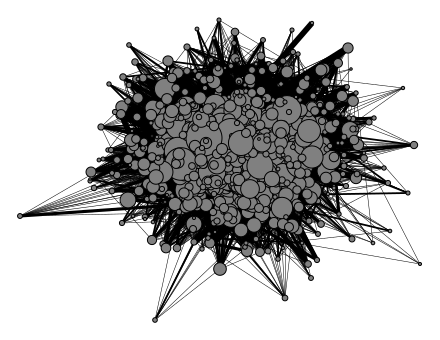

In [4]:
graph = from_edge_list(weighted_edges, directed=True)
image = svg_graph(graph,display_node_weight=True)
SVG(image)

In [6]:
G = nx.DiGraph()
G.add_weighted_edges_from(weighted_edges)

In [7]:
G.number_of_nodes()

1068

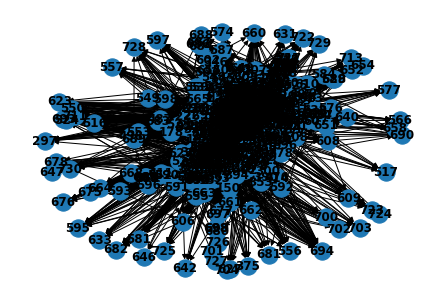

In [40]:
nx.draw(G.subgraph(range(731)), with_labels=True, font_weight='bold')

In [8]:
pos=nx.spring_layout(G)

{0: Text(0.035411372780799866, 0.022980429232120514, '0'),
 1: Text(0.0570463091135025, 0.1353696882724762, '1'),
 2: Text(0.053208962082862854, -0.002453238470479846, '2'),
 3: Text(-0.06418292969465256, -0.0875631794333458, '3'),
 4: Text(-0.07693710178136826, -0.06593963503837585, '4'),
 5: Text(-0.04620671644806862, -0.022594479843974113, '5'),
 6: Text(0.13262367248535156, 0.07176057994365692, '6'),
 7: Text(-0.006886640097945929, 0.05744871124625206, '7'),
 8: Text(0.08075135201215744, -0.004696311429142952, '8'),
 9: Text(-0.07040733098983765, -0.1508731096982956, '9'),
 10: Text(0.06790589541196823, 0.028335705399513245, '10'),
 11: Text(0.05267452821135521, -0.026056399568915367, '11'),
 12: Text(-0.11111796647310257, -0.047265924513339996, '12'),
 13: Text(-0.019824624061584473, 0.06545566022396088, '13'),
 14: Text(0.08458151668310165, 0.17900322377681732, '14'),
 15: Text(0.02938847802579403, 0.021060094237327576, '15'),
 16: Text(0.07327647507190704, 0.08491311222314835, '

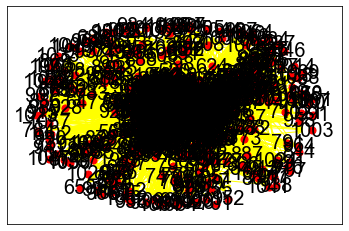

In [9]:
nx.draw_networkx_nodes(G, pos, node_color='red', node_size=50)
nx.draw_networkx_edges(G, pos, edge_color='yellow')
nx.draw_networkx_labels(G, pos, font_size=20, font_family='Arial')


In [12]:
g = nx.stochastic_block_model(edges,weights, seed=0,directed=True)

TypeError: object of type 'int' has no len()

In [23]:
largest = max(nx.strongly_connected_components(G), key=len)
largest

{929}

In [ ]:
print(G.number_of_nodes())
print(G.number_of_edges())

In [30]:
print(nx.density(G))

0.023762763743071864


In [31]:
# Коэффициент ассортативности (насколько вся сеть завязана на основных "хабах"):

print(nx.degree_pearson_correlation_coefficient(G))

-0.009707275510971447


In [32]:
#Коэффициент кластеризации (clustering coefficient) – степень взаимодействия между собой ближайших соседей узла, т.е. #вероятность того, что ближайшие соседи узла будут связаны не только с ним, но и между собой.

# вот какой коэффициент у нашего графа:

print(nx.average_clustering(G))
print(nx.transitivity(G))

0.21392069273905823
0.11384457813100837


In [10]:
math_graph = from_edge_list(data['edges'])
image = svg_graph(math_graph,display_node_weight=True, display_edge_weight=data['weights'],directed=True,names=np.array(list((data['node_ids']))).reshape(1068), node_size_min=2, node_size_max=10, height=400, width=800)
SVG(image)

In [13]:
math_graph = from_edge_list(data['edges'])

In [4]:
import ipycytoscape
import ipywidgets as widgets
import networkx as nx

In [21]:
directed = ipycytoscape.CytoscapeWidget()
directed.graph.add_graph_from_json(json_file='wikivital_mathematics.json', directed=True)

In [22]:
from ipywidgets import Output
from IPython.display import display
from pprint import pformat

In [25]:
out = Output()

def log_clicks(node):
    with out:
        print(f'clicked: {pformat(node)}')

def log_mouseovers(node):
    with out:
        print(f'mouseover: {pformat(node)}')

directed.on('node', 'click', log_clicks)
directed.on('node', 'mouseover', log_mouseovers)
directed

CytoscapeWidget(cytoscape_layout={'name': 'cola'}, cytoscape_style=[{'selector': 'node', 'css': {'background-c…

In [18]:
core = CoreDecomposition()
labels = core.fit_transform(math_graph)
image = svg_graph( math_graph,display_node_weight=True, display_edge_weight=data['weights'],directed=True,names=np.array(list((data['node_ids']))).reshape(1068), node_size_min=10, node_size_max=20, height=4000, width=4000,scores=labels)
SVG(image)

In [6]:
time_periods = {}
for time_period in range(data['time_periods']):
    time_periods[time_period] = data[str(time_period)]

In [7]:
dates = pd.DataFrame.from_dict(time_periods, orient="index", columns=['year', 'month', 'day'])
dates

,year,month,day
0,2019,3,16
1,2019,3,17
2,2019,3,18
3,2019,3,19
4,2019,3,20
...,...,...,...
726,2021,3,11
727,2021,3,12
728,2021,3,13
729,2021,3,14


In [10]:
daily_visits = pd.DataFrame.from_dict(time_periods, orient="index", columns=['y'])
daily_visits

,y
0,"[3962, 774, 1734, 1016, 2463, 436, 214, 402, 3..."
1,"[3923, 772, 1884, 1301, 2365, 497, 163, 470, 3..."
2,"[4617, 827, 2059, 1251, 2801, 593, 255, 562, 5..."
3,"[4822, 863, 2041, 1336, 2935, 530, 279, 576, 4..."
4,"[4871, 906, 2017, 1379, 2803, 559, 265, 611, 5..."
...,...
726,"[5231, 959, 2324, 1644, 2969, 596, 327, 621, 2..."
727,"[4467, 946, 2086, 1236, 2811, 596, 238, 611, 2..."
728,"[4020, 942, 1977, 1161, 2596, 553, 226, 487, 2..."
729,"[4164, 966, 2149, 1277, 2784, 526, 280, 506, 2..."


In [11]:
data['node_ids']

{'Mathematics': 0,
 'Mathematician': 413,
 'Applied mathematics': 12,
 'Pure mathematics': 15,
 'Recreational mathematics': 35,
 'Arithmetic': 16,
 'Counting': 8,
 'Cardinal number': 68,
 'Tally marks': 361,
 'Addition': 18,
 'Plus and minus signs': 504,
 'Subtraction': 19,
 'Multiplication': 20,
 'Multiplication sign': 514,
 'Division (mathematics)': 21,
 'Division sign': 519,
 'Euclidean algorithm': 121,
 'Long division': 520,
 'Division by zero': 292,
 'Divisibility rule': 521,
 'Fraction': 969,
 'Percentage': 487,
 'Percent sign': 931,
 'Continued fraction': 149,
 'Egyptian fraction': 523,
 'Modular arithmetic': 148,
 'Modulo operation': 491,
 'Divisor': 127,
 'Greatest common divisor': 144,
 'Lowest common denominator': 524,
 'Multiple (mathematics)': 516,
 'Least common multiple': 840,
 'Number': 147,
 'Natural number': 55,
 'Integer': 56,
 'Parity (mathematics)': 755,
 'Real number': 62,
 'Negative number': 512,
 'Sign (mathematics)': 507,
 'Complex number': 64,
 'Gaussian integ

In [9]:
pages_pos = pd.DataFrame.from_dict(data['node_ids'], orient='index')
pages_pos.columns = ["pos"]
pages_pos = pages_pos.sort_values("pos")
pages_pos

,pos
Mathematics,0
Number theory,1
Algebra,2
Geometry,3
Calculus,4
...,...
Herschel graph,1063
Tait's conjecture,1064
Multibody system,1065
Dynamic simulation,1066


In [10]:
pos_pages = pd.DataFrame(pages_pos.index, index=pages_pos.pos)
pos_pages.columns = ['page']
pos_pages

,page
pos,
0,Mathematics
1,Number theory
2,Algebra
3,Geometry
4,Calculus
...,...
1063,Herschel graph
1064,Tait's conjecture
1065,Multibody system


In [14]:
pages_pos.loc['Mathematics'].pos

0

In [11]:
pos_pages.loc[929].page

'Monty Hall problem'

In [16]:
daily_visits = pd.DataFrame(daily_visits.y.to_list())
daily_visits

,0,1,2,3,4,5,6,7,8,9,...,1058,1059,1060,1061,1062,1063,1064,1065,1066,1067
0,3962,774,1734,1016,2463,436,214,402,363,490,...,0,56,66,38,1,11,5,36,20,364
1,3923,772,1884,1301,2365,497,163,470,342,508,...,18,74,60,53,5,7,10,37,26,334
2,4617,827,2059,1251,2801,593,255,562,519,711,...,128,130,112,90,6,15,21,47,39,468
3,4822,863,2041,1336,2935,530,279,576,474,842,...,132,129,101,78,9,6,14,73,39,487
4,4871,906,2017,1379,2803,559,265,611,502,721,...,98,131,59,67,12,18,6,97,39,448
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
726,5231,959,2324,1644,2969,596,327,621,261,660,...,208,168,62,97,11,4,8,40,38,624
727,4467,946,2086,1236,2811,596,238,611,255,474,...,203,226,38,72,12,9,6,32,26,540
728,4020,942,1977,1161,2596,553,226,487,229,357,...,154,111,53,58,8,14,4,33,23,423
729,4164,966,2149,1277,2784,526,280,506,238,478,...,188,114,33,56,3,13,8,21,31,616


In [17]:
daily_visits = daily_visits.set_index(pd.to_datetime(dates))
daily_visits

,0,1,2,3,4,5,6,7,8,9,...,1058,1059,1060,1061,1062,1063,1064,1065,1066,1067
2019-03-16,3962,774,1734,1016,2463,436,214,402,363,490,...,0,56,66,38,1,11,5,36,20,364
2019-03-17,3923,772,1884,1301,2365,497,163,470,342,508,...,18,74,60,53,5,7,10,37,26,334
2019-03-18,4617,827,2059,1251,2801,593,255,562,519,711,...,128,130,112,90,6,15,21,47,39,468
2019-03-19,4822,863,2041,1336,2935,530,279,576,474,842,...,132,129,101,78,9,6,14,73,39,487
2019-03-20,4871,906,2017,1379,2803,559,265,611,502,721,...,98,131,59,67,12,18,6,97,39,448
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-03-11,5231,959,2324,1644,2969,596,327,621,261,660,...,208,168,62,97,11,4,8,40,38,624
2021-03-12,4467,946,2086,1236,2811,596,238,611,255,474,...,203,226,38,72,12,9,6,32,26,540
2021-03-13,4020,942,1977,1161,2596,553,226,487,229,357,...,154,111,53,58,8,14,4,33,23,423
2021-03-14,4164,966,2149,1277,2784,526,280,506,238,478,...,188,114,33,56,3,13,8,21,31,616


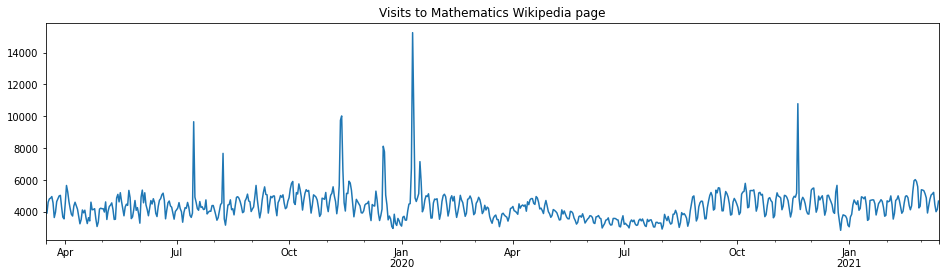

In [18]:
daily_visits[pages_pos.loc['Mathematics'].pos].plot(
    figsize=(16, 4),
    title="Visits to Mathematics Wikipedia page"
)
plt.show()

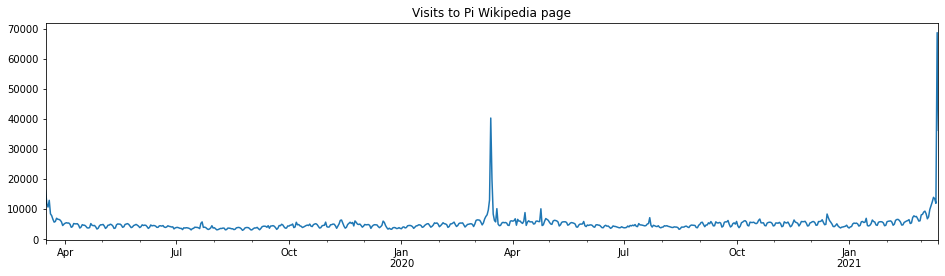

In [19]:
daily_visits[pages_pos.loc['Pi'].pos].plot(
    figsize=(16, 4),
    title="Visits to Pi Wikipedia page"
)
plt.show()